In [1]:
import Metropolis.Metropolis as mt
import numpy as np
import matplotlib.pyplot as plt

In [2]:
size = 30          # size N x N
T = 2.0            # k_B = 1
n_sweeps = int(1e5  )  # Metropolis steps
temperature = T

In [3]:
## generate ising model data
S = mt.get_one_sample(size, T, n_sweeps)
energy = mt.total_energy(S)


size of the sample: (30, 30)
initial energy: 96.0
epoch #100, current energy: -68.0
epoch #200, current energy: -220.0
epoch #300, current energy: -288.0
epoch #400, current energy: -368.0
epoch #500, current energy: -420.0
epoch #600, current energy: -464.0
epoch #700, current energy: -480.0
epoch #800, current energy: -528.0
epoch #900, current energy: -580.0
epoch #1000, current energy: -604.0
epoch #1100, current energy: -632.0
epoch #1200, current energy: -636.0
epoch #1300, current energy: -660.0
epoch #1400, current energy: -688.0
epoch #1500, current energy: -716.0
epoch #1600, current energy: -708.0
epoch #1700, current energy: -712.0
epoch #1800, current energy: -748.0
epoch #1900, current energy: -784.0
epoch #2000, current energy: -756.0
epoch #2100, current energy: -752.0
epoch #2200, current energy: -768.0
epoch #2300, current energy: -784.0
epoch #2400, current energy: -816.0
epoch #2500, current energy: -848.0
epoch #2600, current energy: -848.0
epoch #2700, current ene

1. 计算自相关时间 τ vs T & vs L 绘图

In [4]:
## compute autocorrelation function and integrated autocorrelation time
def autocorrelation(A):
    """
    Compute normalized autocorrelation function ρ(t)
    using FFT convolution for speed.
    """
    A = np.array(A)
    A -= np.mean(A)

    # 使用快速傅里叶变换加速 O(N log N)
    f = np.fft.fft(A, n=2*len(A))
    acf = np.fft.ifft(f * np.conjugate(f))[:len(A)].real
    acf /= acf[0]  # normalize
    return acf

def integrated_autocorrelation_time(rho, c=8):
    """
    Compute τ_int by summing ρ(t) until t < c * τ_int (self-consistent window).
    """
    tau = 0.5
    for t in range(1, len(rho)):
        if t > c * tau:
            break
        tau += rho[t]
    return tau



In [4]:
## another way to compute autocorrelation and tau_int

# ---------- 1. autocorrelation via FFT (Wiener–Khinchin) ----------
def autocorrelation_fft(x):
    """
    Compute normalized autocorrelation using FFT (O(N log N)).
    """
    x = np.asarray(x, dtype=np.float64)
    x -= np.mean(x)
    n = len(x)
    # next power of 2 for efficiency
    n2 = 1 << (2*n - 1).bit_length()

    f = np.fft.fft(x, n2)
    acf = np.fft.ifft(f * np.conjugate(f)).real[:n]
    acf /= acf[0]
    return acf


# ---------- 2. Madras–Sokal window (robust τ_int estimator) ----------
def integrated_autocorrelation_time_fft(acf):
    """
    Robust estimator for integrated autocorrelation time using
    Madras–Sokal criterion: stop when ACF first becomes negative.
    """
    tau = 0.5  # start with first term
    
    for t in range(1, len(acf)):
        if acf[t] <= 0:  # stop at first non-positive value (noise control)
            break
        tau += acf[t]
    
    return tau


In [5]:
energies = []
magnetizations = []

for sweep in range(n_sweeps):
    S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
    energies.append(energy)
    magnetizations.append(np.sum(S))

# 计算 ACF + τ_int
rho_E = autocorrelation_fft(energies)
tau_E = integrated_autocorrelation_time_fft(rho_E)

rho_M = autocorrelation_fft(magnetizations)
tau_M = integrated_autocorrelation_time_fft(rho_M)

print("τ_int (Energy) =", tau_E)
print("τ_int (Magnetization) =", tau_M)


τ_int (Energy) = 5773.872174351515
τ_int (Magnetization) = 8850.217661081855


In [7]:
#example usage
energies = []
magnetizations = []


for sweep in range(n_sweeps):
    S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
    energies.append(energy)
    magnetizations.append(np.sum(S))

rho_E = autocorrelation(energies)
tau_E = integrated_autocorrelation_time(rho_E)

rho_M = autocorrelation(magnetizations)
tau_M = integrated_autocorrelation_time(rho_M)

print("τ_int (Energy) =", tau_E)
print("τ_int (Magnetization) =", tau_M)



UFuncTypeError: Cannot cast ufunc 'subtract' output from dtype('float64') to dtype('int64') with casting rule 'same_kind'

In [10]:
#plotting tau vs T and L
temperatures = np.linspace(1.0, 10, 100)
sizes = np.arange(10, 101, 10)
tau_E_vs_T = []
tau_M_vs_T = []
for T in temperatures:
    S = mt.get_one_sample(size, T, n_sweeps)
    energy = mt.total_energy(S)
    energies = []
    magnetizations = []
    for sweep in range(n_sweeps):
        S, energy = mt.metropolis_sweep(S, T, current_energy=energy)
        energies.append(energy)
        magnetizations.append(np.sum(S))
    rho_E = autocorrelation_fft(energies)
    tau_E = integrated_autocorrelation_time_fft(rho_E)
    rho_M = autocorrelation_fft(magnetizations)
    tau_M = integrated_autocorrelation_time_fft(rho_M)
    tau_E_vs_T.append(tau_E)
    tau_M_vs_T.append(tau_M)

# tau_E_vs_L = []
# tau_M_vs_L = []
# for L in sizes:
#     S = mt.get_one_sample(L, temperature, n_sweeps)
#     energy = mt.total_energy(S)
#     energies = []
#     magnetizations = []
#     for sweep in range(n_sweeps):
#         S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
#         energies.append(energy)
#         magnetizations.append(np.sum(S))
#     rho_E = autocorrelation(energies)
#     tau_E = integrated_autocorrelation_time(rho_E)
#     rho_M = autocorrelation(magnetizations)
#     tau_M = integrated_autocorrelation_time(rho_M)
#     tau_E_vs_L.append(tau_E)
#     tau_M_vs_L.append(tau_M)
# plt.figure(figsize=(10, 5))
# plt.plot(sizes, tau_E_vs_L, label='Energy', linewidth=2.5)
# plt.plot(sizes, tau_M_vs_L, label='Magnetization', linewidth=2.5)
# plt.xlabel('Lattice Size L', fontsize=16)
# plt.ylabel('Integrated Autocorrelation Time τ_int', fontsize=16)
# plt.title('autocorrelation time versus scale of square shaped Ising model', fontsize=20)
# plt.xticks(fontsize=14)
# plt.yticks(fontsize=14)
# plt.legend(fontsize=14)
# plt.tight_layout()
# plt.show()


size of the sample: (30, 30)
initial energy: -20.0
epoch #100, current energy: -124.0
epoch #200, current energy: -276.0
epoch #300, current energy: -360.0
epoch #400, current energy: -412.0
epoch #500, current energy: -460.0
epoch #600, current energy: -520.0
epoch #700, current energy: -576.0
epoch #800, current energy: -604.0
epoch #900, current energy: -680.0
epoch #1000, current energy: -732.0
epoch #1100, current energy: -752.0
epoch #1200, current energy: -780.0
epoch #1300, current energy: -816.0
epoch #1400, current energy: -844.0
epoch #1500, current energy: -856.0
epoch #1600, current energy: -868.0
epoch #1700, current energy: -916.0
epoch #1800, current energy: -928.0
epoch #1900, current energy: -948.0
epoch #2000, current energy: -980.0
epoch #2100, current energy: -1008.0
epoch #2200, current energy: -1040.0
epoch #2300, current energy: -1084.0
epoch #2400, current energy: -1120.0
epoch #2500, current energy: -1140.0
epoch #2600, current energy: -1140.0
epoch #2700, cur

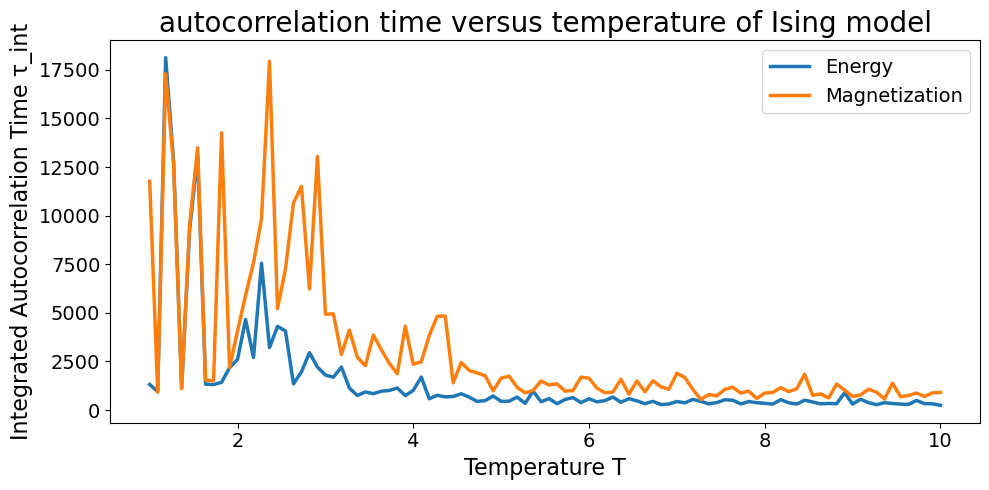

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(temperatures, tau_E_vs_T, label='Energy', linewidth=2.5)
plt.plot(temperatures, tau_M_vs_T, label='Magnetization', linewidth=2.5)
plt.xlabel('Temperature T', fontsize=16)
plt.ylabel('Integrated Autocorrelation Time τ_int', fontsize=16)
plt.title('autocorrelation time versus temperature of Ising model', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()

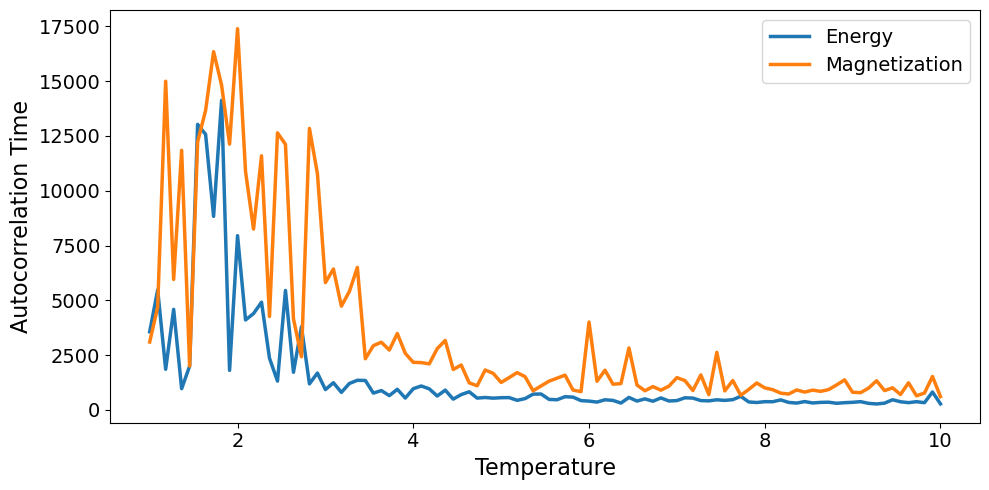

In [11]:
plt.figure(figsize=(10, 5))
plt.plot(temperatures, tau_E_vs_T, label='Energy', linewidth=2.5)
plt.plot(temperatures, tau_M_vs_T, label='Magnetization', linewidth=2.5)
plt.xlabel('Temperature', fontsize=16)
plt.ylabel('Autocorrelation Time', fontsize=16)
# plt.title('autocorrelation time versus temperature of Ising model', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()

size of the sample: (10, 10)
initial energy: 0.0
epoch #100, current energy: -16.0
epoch #200, current energy: -12.0
epoch #300, current energy: -16.0
epoch #400, current energy: -28.0
epoch #500, current energy: -20.0
epoch #600, current energy: -8.0
epoch #700, current energy: 4.0
epoch #800, current energy: -4.0
epoch #900, current energy: -16.0
epoch #1000, current energy: 0.0
epoch #1100, current energy: -4.0
epoch #1200, current energy: -36.0
epoch #1300, current energy: -16.0
epoch #1400, current energy: -20.0
epoch #1500, current energy: -36.0
epoch #1600, current energy: 4.0
epoch #1700, current energy: -40.0
epoch #1800, current energy: -8.0
epoch #1900, current energy: -24.0
epoch #2000, current energy: -16.0
epoch #2100, current energy: -20.0
epoch #2200, current energy: -40.0
epoch #2300, current energy: -4.0
epoch #2400, current energy: -20.0
epoch #2500, current energy: -40.0
epoch #2600, current energy: -24.0
epoch #2700, current energy: 0.0
epoch #2800, current energy:

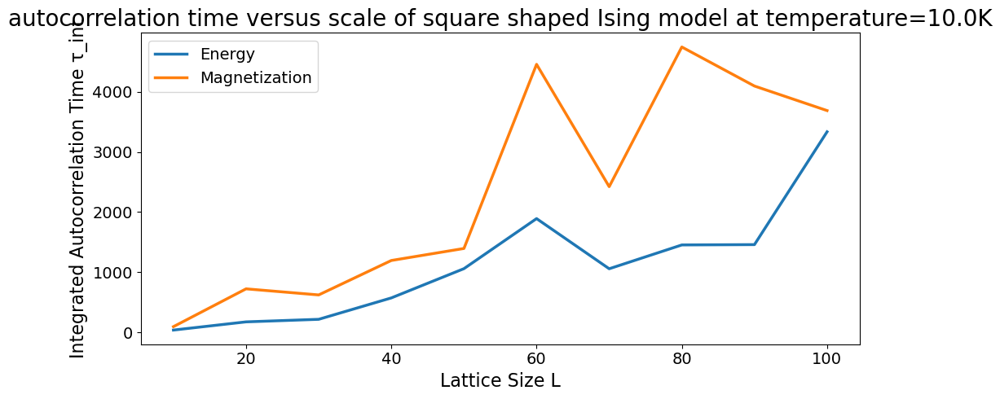

In [ ]:
tau_E_vs_L = []
tau_M_vs_L = []
## temperature larger than Tc
temperature = 10.0
for L in sizes:
    S = mt.get_one_sample(L, temperature, n_sweeps)
    energy = mt.total_energy(S)
    energies = []
    magnetizations = []
    for sweep in range(n_sweeps):
        S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
        energies.append(energy)
        magnetizations.append(np.sum(S))
    rho_E = autocorrelation_fft(energies)
    tau_E = integrated_autocorrelation_time_fft(rho_E)
    rho_M = autocorrelation_fft(magnetizations)
    tau_M = integrated_autocorrelation_time_fft(rho_M)
    tau_E_vs_L.append(tau_E)
    tau_M_vs_L.append(tau_M)
plt.figure(figsize=(10, 5))
plt.plot(sizes, tau_E_vs_L, label='Energy', linewidth=2.5)
plt.plot(sizes, tau_M_vs_L, label='Magnetization', linewidth=2.5)
plt.xlabel('Lattice Size L', fontsize=16)
plt.ylabel('Integrated Autocorrelation Time τ_int', fontsize=16)
plt.title(f'autocorrelation time versus scale of square shaped Ising model at temperature={temperature}K', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()


size of the sample: (10, 10)
initial energy: -8.0
epoch #100, current energy: -12.0
epoch #200, current energy: -4.0
epoch #300, current energy: -36.0
epoch #400, current energy: -48.0
epoch #500, current energy: -12.0
epoch #600, current energy: 0.0
epoch #700, current energy: -16.0
epoch #800, current energy: -52.0
epoch #900, current energy: -20.0
epoch #1000, current energy: -12.0
epoch #1100, current energy: -40.0
epoch #1200, current energy: -56.0
epoch #1300, current energy: -16.0
epoch #1400, current energy: -24.0
epoch #1500, current energy: -32.0
epoch #1600, current energy: -36.0
epoch #1700, current energy: -8.0
epoch #1800, current energy: -24.0
epoch #1900, current energy: -28.0
epoch #2000, current energy: -24.0
epoch #2100, current energy: -16.0
epoch #2200, current energy: -4.0
epoch #2300, current energy: -4.0
epoch #2400, current energy: -20.0
epoch #2500, current energy: -36.0
epoch #2600, current energy: -20.0
epoch #2700, current energy: -28.0
epoch #2800, current

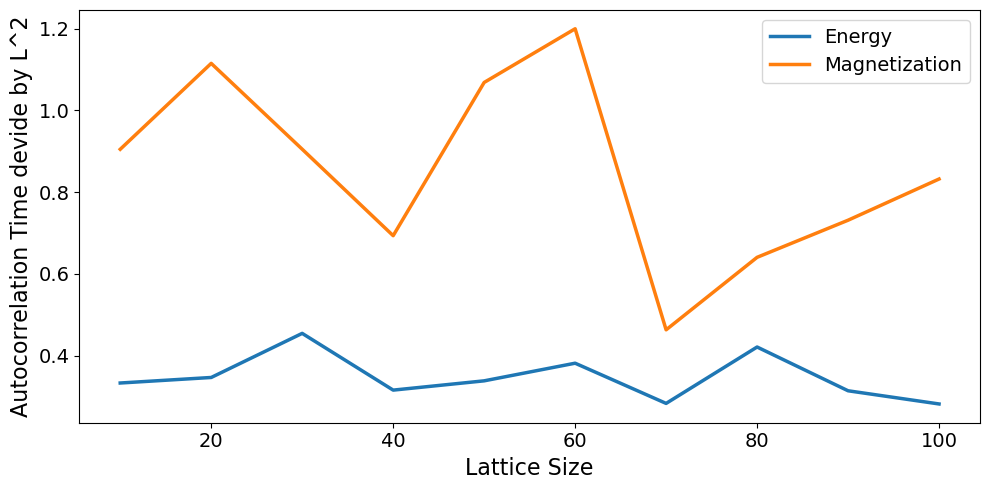

In [7]:
tau_E_vs_L = []
tau_M_vs_L = []
sizes = np.arange(10, 101, 10)
## temperature larger than Tc
temperature = 10.0
for L in sizes:
    S = mt.get_one_sample(L, temperature, n_sweeps)
    energy = mt.total_energy(S)
    energies = []
    magnetizations = []
    for sweep in range(n_sweeps):
        S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
        energies.append(energy)
        magnetizations.append(np.sum(S))
    rho_E = autocorrelation_fft(energies)
    tau_E = integrated_autocorrelation_time_fft(rho_E)/L**2
    rho_M = autocorrelation_fft(magnetizations)
    tau_M = integrated_autocorrelation_time_fft(rho_M)/L**2
    tau_E_vs_L.append(tau_E)
    tau_M_vs_L.append(tau_M)
plt.figure(figsize=(10, 5))
plt.plot(sizes, tau_E_vs_L, label='Energy', linewidth=2.5)
plt.plot(sizes, tau_M_vs_L, label='Magnetization', linewidth=2.5)
plt.xlabel('Lattice Size', fontsize=16)
plt.ylabel('Autocorrelation Time devide by L^2', fontsize=16)
# plt.title(f'autocorrelation time versus scale of square shaped Ising model at temperature={temperature}K', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()


size of the sample: (10, 10)
initial energy: 0.0
epoch #100, current energy: -60.0
epoch #200, current energy: -92.0
epoch #300, current energy: -104.0
epoch #400, current energy: -88.0
epoch #500, current energy: -68.0
epoch #600, current energy: -92.0
epoch #700, current energy: -128.0
epoch #800, current energy: -140.0
epoch #900, current energy: -128.0
epoch #1000, current energy: -140.0
epoch #1100, current energy: -132.0
epoch #1200, current energy: -156.0
epoch #1300, current energy: -148.0
epoch #1400, current energy: -148.0
epoch #1500, current energy: -164.0
epoch #1600, current energy: -156.0
epoch #1700, current energy: -172.0
epoch #1800, current energy: -156.0
epoch #1900, current energy: -156.0
epoch #2000, current energy: -164.0
epoch #2100, current energy: -168.0
epoch #2200, current energy: -176.0
epoch #2300, current energy: -152.0
epoch #2400, current energy: -152.0
epoch #2500, current energy: -192.0
epoch #2600, current energy: -152.0
epoch #2700, current energy: 

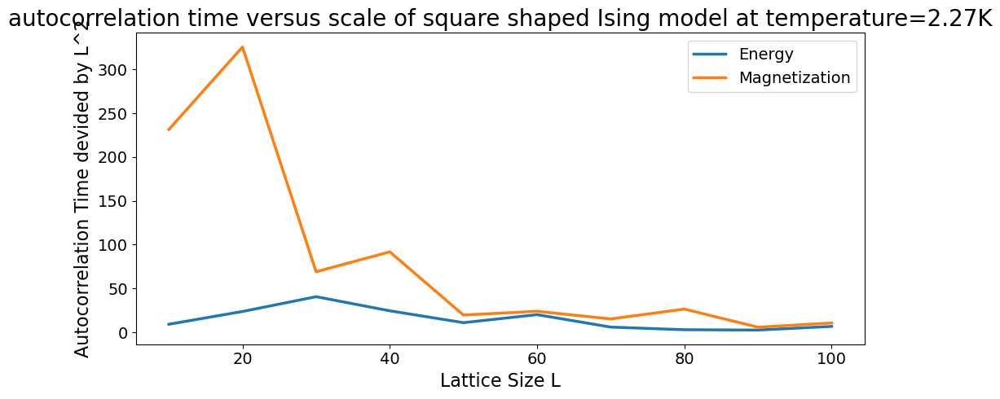

In [13]:
tau_E_vs_L = []
tau_M_vs_L = []
n_sweeps = int(1e6)
sizes = np.arange(10, 101, 10)
## temperature larger than Tc
temperature = 2.27
for L in sizes:
    S = mt.get_one_sample(L, temperature, n_sweeps)
    energy = mt.total_energy(S)
    energies = []
    magnetizations = []
    for sweep in range(n_sweeps):
        S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
        energies.append(energy)
        magnetizations.append(np.sum(S))
    rho_E = autocorrelation_fft(energies)
    tau_E = integrated_autocorrelation_time_fft(rho_E)/L**2
    rho_M = autocorrelation_fft(magnetizations)
    tau_M = integrated_autocorrelation_time_fft(rho_M)/L**2
    tau_E_vs_L.append(tau_E)
    tau_M_vs_L.append(tau_M)
plt.figure(figsize=(10, 5))
plt.plot(sizes, tau_E_vs_L, label='Energy', linewidth=2.5)
plt.plot(sizes, tau_M_vs_L, label='Magnetization', linewidth=2.5)
plt.xlabel('Lattice Size L', fontsize=16)
plt.ylabel('Autocorrelation Time devided by L^2', fontsize=16)
plt.title(f'autocorrelation time versus scale of square shaped Ising model at temperature={temperature}K', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()


In [14]:
## integrated autocorrelation time method 2
def autocorrelation_fft(x):
    """
    Normalized ACF using FFT.
    """
    x = np.asarray(x, dtype=np.float64)
    n = len(x)
    if n < 2:
        return np.ones(n, dtype=np.float64)

    x = x - np.mean(x)

    n2 = 1 << (2 * n - 1).bit_length()
    f = np.fft.fft(x, n=n2)
    acf = np.fft.ifft(f * np.conjugate(f)).real[:n]

    # unbiased normalization 
    acf /= np.arange(n, 0, -1)

    # normalize
    acf /= acf[0]
    return acf


def tau_int_window(rho, c=8):
    """
    Integrated autocorrelation time with windowing method.
    """
    rho = np.asarray(rho, dtype=np.float64)
    tau = 0.5
    for t in range(1, len(rho)):
        if t > c * tau:
            break
        tau += rho[t]
    return float(tau)


size of the sample: (10, 10)
initial energy: 0.0
epoch #100, current energy: -60.0
epoch #200, current energy: -76.0
epoch #300, current energy: -80.0
epoch #400, current energy: -84.0
epoch #500, current energy: -96.0
epoch #600, current energy: -104.0
epoch #700, current energy: -100.0
epoch #800, current energy: -128.0
epoch #900, current energy: -100.0
epoch #1000, current energy: -96.0
epoch #1100, current energy: -132.0
epoch #1200, current energy: -112.0
epoch #1300, current energy: -100.0
epoch #1400, current energy: -96.0
epoch #1500, current energy: -128.0
epoch #1600, current energy: -124.0
epoch #1700, current energy: -132.0
epoch #1800, current energy: -140.0
epoch #1900, current energy: -132.0
epoch #2000, current energy: -128.0
epoch #2100, current energy: -112.0
epoch #2200, current energy: -108.0
epoch #2300, current energy: -92.0
epoch #2400, current energy: -124.0
epoch #2500, current energy: -88.0
epoch #2600, current energy: -120.0
epoch #2700, current energy: -108

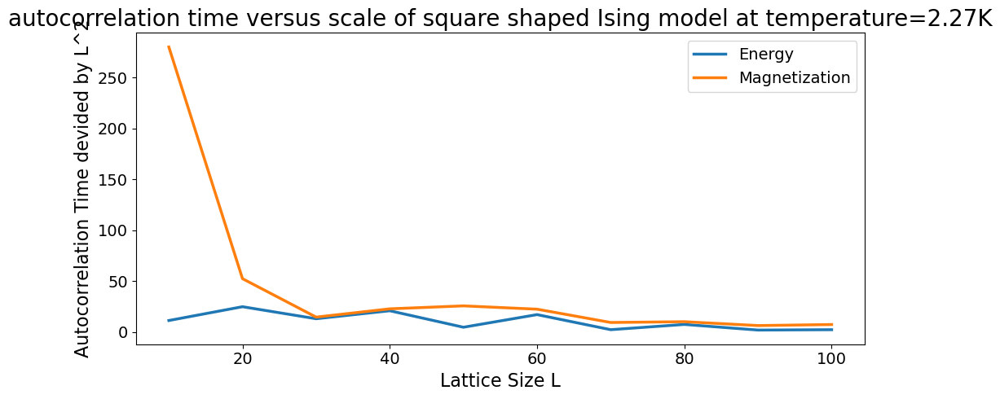

In [16]:
## integration with windowing method at T=2.27
tau_E_vs_L = []
tau_M_vs_L = []
sizes = np.arange(10, 101, 10)
## temperature larger than Tc
temperature = 2.27
for L in sizes:
    S = mt.get_one_sample(L, temperature, n_sweeps)
    energy = mt.total_energy(S)
    energies = []
    magnetizations = []
    for sweep in range(n_sweeps):
        S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
        energies.append(energy)
        magnetizations.append(np.sum(S))
    rho_E = autocorrelation_fft(energies)
    tau_E = tau_int_window(rho_E)/L**2
    rho_M = autocorrelation_fft(magnetizations)
    tau_M = tau_int_window(rho_M)/L**2
    tau_E_vs_L.append(tau_E)
    tau_M_vs_L.append(tau_M)
plt.figure(figsize=(10, 5))
plt.plot(sizes, tau_E_vs_L, label='Energy', linewidth=2.5)
plt.plot(sizes, tau_M_vs_L, label='Magnetization', linewidth=2.5)
plt.xlabel('Lattice Size L', fontsize=16)
plt.ylabel('Autocorrelation Time devided by L^2', fontsize=16)
plt.title(f'autocorrelation time versus scale of square shaped Ising model at temperature={temperature}K', fontsize=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# drawing generation process of monte carlo ising samples
from matplotlib.animation import FuncAnimation


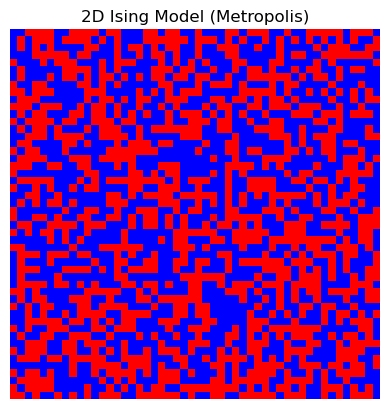

In [ ]:
def metropolis_step(lattice, beta):
    N = lattice.shape[0]

    for _ in range(N*N):   # one sweep
        i = np.random.randint(0, N)
        j = np.random.randint(0, N)
        s = lattice[i, j]

        # 4 neighbors with periodic BC
        nb = lattice[(i+1) % N, j] + lattice[(i-1) % N, j] + \
             lattice[i, (j+1) % N] + lattice[i, (j-1) % N]

        dE = 2 * s * nb   # ΔE = 2*s*sum(nbr)

        # Metropolis acceptance
        if dE < 0 or np.random.rand() < np.exp(-beta * dE):
            lattice[i, j] *= -1

    return lattice

N = 50
kB = 1
beta = 1/ T/kB 
lattice = np.random.choice([-1, 1], size=(N, N))

fig, ax = plt.subplots()
img = ax.imshow(lattice, cmap='bwr', vmin=-1, vmax=1)
ax.set_title("2D Ising Model (Metropolis)")
ax.axis("off")


def update(frame):
    global lattice
    lattice = metropolis_step(lattice, beta)
    img.set_data(lattice)
    return [img]


ani = FuncAnimation(fig, update, frames=300, interval=50)
plt.show()

MovieWriter ffmpeg unavailable; using Pillow instead.


GIF saved as ising_evolution.gif


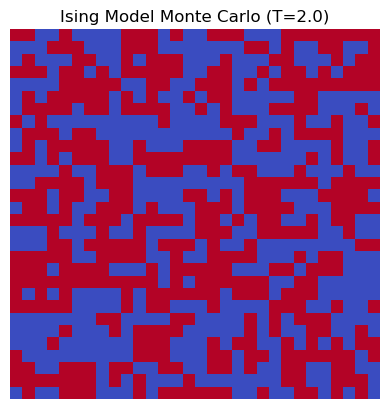

In [ ]:
## try2
from matplotlib.animation import FuncAnimation

def animate_ising(size=30, T=2.0, sweeps=200, save_gif=True):
    beta = 1.0 / T

    # 初始随机状态
    S = np.random.choice([-1, 1], size=(size, size))

    fig, ax = plt.subplots()
    im = ax.imshow(S, cmap='coolwarm', vmin=-1, vmax=1)
    ax.set_title(f"Ising Model Monte Carlo (T={T})")
    ax.axis("off")

    energies = []
    frames = []

    # ========= 更新函数 =========
    def update(frame):
        nonlocal S
        S, _ = mt.metropolis_sweep(S, T)
        im.set_data(S)
        return [im]

    # ========= 生成动画 =========
    ani = FuncAnimation(fig, update, frames=sweeps, interval=50)

    # ========= 保存 GIF =========
    if save_gif:
        ani.save("ising_evolution.gif", fps=50)
        print("GIF saved as ising_evolution.gif")

    plt.show()
    return ani


if __name__ == "__main__":
    animate_ising(size=30, T=2.0, sweeps=300)

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import mt  # 你的 Metropolis 实现

def animate_ising_frames(size=30, T=2.0, sweeps=200, outdir="frames"):
    beta = 1.0 / T

    # 初始随机状态
    S = np.random.choice([-1, 1], size=(size, size))

    # 创建输出文件夹
    import os
    os.makedirs(outdir, exist_ok=True)

    fig, ax = plt.subplots()
    im = ax.imshow(S, cmap='coolwarm', vmin=-1, vmax=1)
    ax.set_title(f"Ising Model Monte Carlo (T={T})")
    ax.axis("off")

    for i in range(sweeps):
        # 更新一次 Metropolis sweep
        S, _ = mt.metropolis_sweep(S, T)

        # 更新画面
        im.set_data(S)

        # 保存当前帧
        fname = f"{outdir}/frame_{i:04d}.png"
        plt.savefig(fname, dpi=120, bbox_inches="tight", pad_inches=0)
        print(f"Saved {fname}")

    plt.close()
    print("All frames saved.")

if __name__ == "__main__":
    animate_ising_frames(size=30, T=2.0, sweeps=300)


Saved frames/frame_0000.png
Saved frames/frame_0001.png
Saved frames/frame_0002.png
Saved frames/frame_0003.png
Saved frames/frame_0004.png
Saved frames/frame_0005.png
Saved frames/frame_0006.png
Saved frames/frame_0007.png
Saved frames/frame_0008.png
Saved frames/frame_0009.png
Saved frames/frame_0010.png
Saved frames/frame_0011.png
Saved frames/frame_0012.png
Saved frames/frame_0013.png
Saved frames/frame_0014.png
Saved frames/frame_0015.png
Saved frames/frame_0016.png
Saved frames/frame_0017.png
Saved frames/frame_0018.png
Saved frames/frame_0019.png
Saved frames/frame_0020.png
Saved frames/frame_0021.png
Saved frames/frame_0022.png
Saved frames/frame_0023.png
Saved frames/frame_0024.png
Saved frames/frame_0025.png
Saved frames/frame_0026.png
Saved frames/frame_0027.png
Saved frames/frame_0028.png
Saved frames/frame_0029.png
Saved frames/frame_0030.png
Saved frames/frame_0031.png
Saved frames/frame_0032.png
Saved frames/frame_0033.png
Saved frames/frame_0034.png
Saved frames/frame_0

size of the sample: (10, 10)
initial energy: 12.0
epoch #100, current energy: -92.0
epoch #200, current energy: -116.0
epoch #300, current energy: -128.0
epoch #400, current energy: -128.0
epoch #500, current energy: -132.0
epoch #600, current energy: -132.0
epoch #700, current energy: -140.0
epoch #800, current energy: -128.0
epoch #900, current energy: -132.0
epoch #1000, current energy: -140.0
epoch #1000, final energy: -140.0
size of the sample: (10, 10)
initial energy: 0.0
epoch #100, current energy: -72.0
epoch #200, current energy: -116.0
epoch #300, current energy: -144.0
epoch #400, current energy: -156.0
epoch #500, current energy: -160.0
epoch #600, current energy: -168.0
epoch #700, current energy: -172.0
epoch #800, current energy: -188.0
epoch #900, current energy: -192.0
epoch #1000, current energy: -192.0
epoch #1000, final energy: -192.0
size of the sample: (10, 10)
initial energy: -8.0
epoch #100, current energy: -68.0
epoch #200, current energy: -96.0
epoch #300, cur

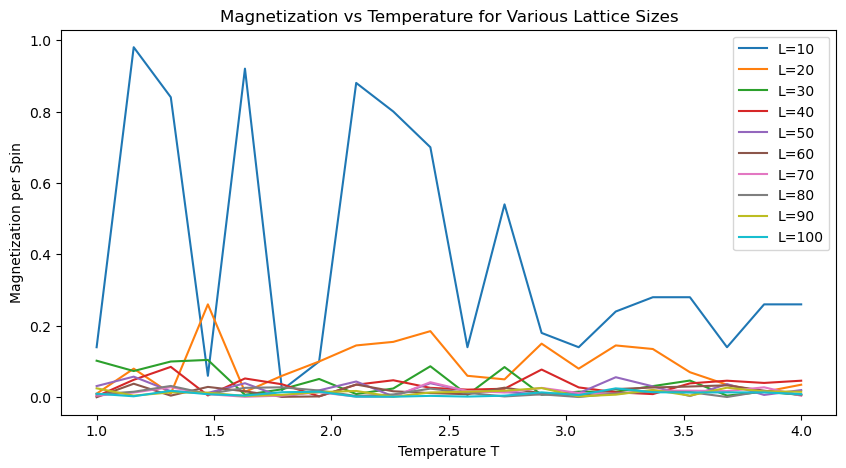

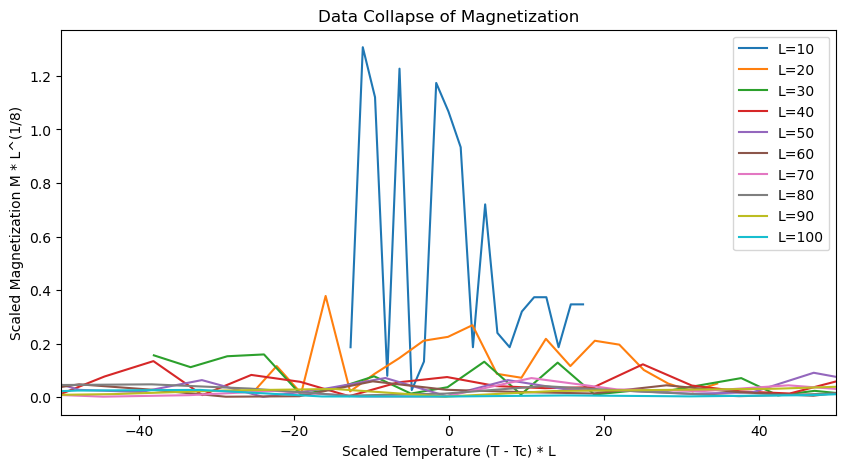

In [ ]:
## drawing the finited size scaling and data collapse
## drawing the finited size scaling and data collapse
temperatures = np.linspace(1.0, 4.0, 20)
sizes = np.arange(10, 101, 10)
magnetizations = {}
for L in sizes:
    mags = []
    for T in temperatures:
        S = mt.get_one_sample(L, T, n_sweeps)
        mags.append(np.abs(np.sum(S)) / (L*L))
    magnetizations[L] = mags
# sigma of magnetization
plt.figure(figsize=(10, 5))
for L in sizes:
    plt.plot(temperatures, magnetizations[L], label=f'L={L}')
plt.xlabel('Temperature T')
plt.ylabel('Magnetization per Spin')
plt.title('Magnetization vs Temperature for Various Lattice Sizes')
plt.legend()
plt.show()
# data collapse
Tc = 2.269
beta = 1 / (kB * temperatures)
plt.figure(figsize=(10, 5))
for L in sizes:
    scaled_T = (temperatures - Tc) * L
    scaled_M = np.array(magnetizations[L]) * L**(1/8)
    plt.plot(scaled_T, scaled_M, label=f'L={L}')
plt.xlabel('Scaled Temperature (T - Tc) * L')
plt.xlim(-50, 50)
plt.ylabel('Scaled Magnetization M * L^(1/8)')
plt.title('Data Collapse of Magnetization')
plt.legend()
plt.show()


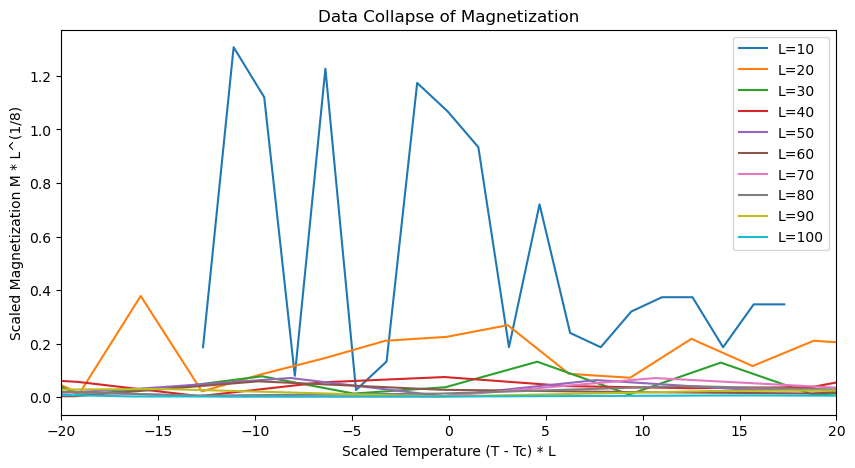

In [ ]:
# data collapse
Tc = 2.269
beta = 1 / (kB * temperatures)
plt.figure(figsize=(10, 5))
for L in sizes:
    scaled_T = (temperatures - Tc) * L
    scaled_M = np.array(magnetizations[L]) * L**(1/8)
    plt.plot(scaled_T, scaled_M, label=f'L={L}')
plt.xlabel('Scaled Temperature (T - Tc) * L')
plt.xlim(-20, 20)
plt.ylabel('Scaled Magnetization M * L^(1/8)')
plt.title('Data Collapse of Magnetization')
plt.legend()
plt.show()

数据量太少，collapse失败了，所以要增加数据量


Running L=10, T=1.000
size of the sample: (10, 10)
initial energy: -4.0
epoch #100, current energy: -80.0
epoch #200, current energy: -112.0
epoch #300, current energy: -128.0
epoch #400, current energy: -132.0
epoch #500, current energy: -132.0
epoch #600, current energy: -136.0
epoch #700, current energy: -136.0
epoch #800, current energy: -136.0
epoch #900, current energy: -132.0
epoch #1000, current energy: -136.0
epoch #1100, current energy: -148.0
epoch #1200, current energy: -144.0
epoch #1300, current energy: -152.0
epoch #1400, current energy: -152.0
epoch #1500, current energy: -152.0
epoch #1600, current energy: -152.0
epoch #1700, current energy: -152.0
epoch #1800, current energy: -152.0
epoch #1900, current energy: -152.0
epoch #2000, current energy: -152.0
epoch #2100, current energy: -152.0
epoch #2200, current energy: -152.0
epoch #2300, current energy: -148.0
epoch #2400, current energy: -148.0
epoch #2500, current energy: -144.0
epoch #2600, current energy: -148.0
e

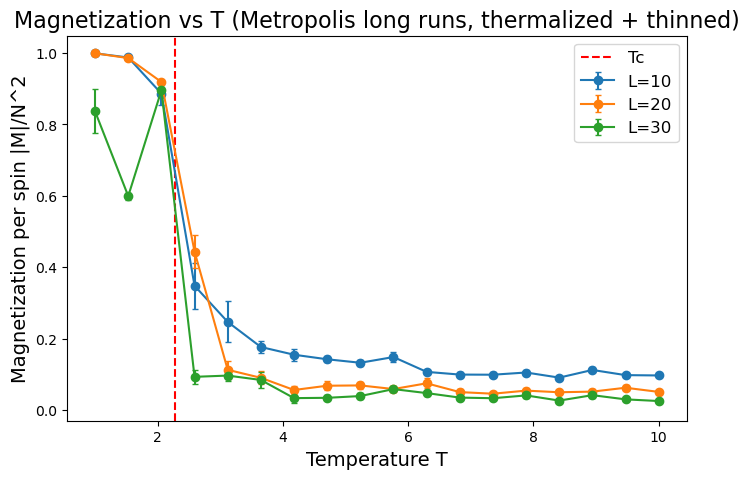

In [ ]:

# ----------------------------
# Simulation runner using the long-run method
# ----------------------------
def run_long_metropolis(size, temperature, n_sweeps=int(1e300), J=1.0, thermal_frac=0.3, verbose=True):
    """
    Run Metropolis for n_sweeps (each sweep = N^2 attempts).
    - Discard first thermal_frac fraction as thermalization.
    - Compute autocorrelation times from the remaining sequence.
    - Determine sampling interval = max(1, int(2*tau_int)) and thin the samples.
    Returns a dict with raw time series, tau estimates, sampled statistics.
    """
    N = size
    energies = []
    magnetizations = []
    S = mt.get_one_sample(size, T, n_sweeps)
    energy = mt.total_energy(S)
    for sweep in range(n_sweeps):
        S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
        energies.append(energy)
        magnetizations.append(np.sum(S))
    # thermalization discard
    t0 = int(np.floor(thermal_frac * n_sweeps))
    energies_eq = energies[t0:]
    mags_eq = magnetizations[t0:]

    # compute autocorrelation and tau_int for both observables
    rho_E = autocorrelation_fft(energies_eq)
    rho_M = autocorrelation_fft(mags_eq)
    tau_E = integrated_autocorrelation_time_fft(rho_E)
    tau_M = integrated_autocorrelation_time_fft(rho_M)

    if verbose:
        print(f"After discarding first {thermal_frac*100:.0f}% (t0={t0}):")
        print(f"  tau_int (Energy) = {tau_E:.2f}")
        print(f"  tau_int (Magnetization) = {tau_M:.2f}")

    # choose sampling interval from magnetization (or take max of both)
    sampling_interval = max(1, int(2 * tau_M))  # using 2*tau rule (conservative)
    if verbose:
        print(f"Using sampling_interval = {sampling_interval}")

    # thin the post-thermalization sequences
    # sampled_mags = mags_eq[::sampling_interval]
    # sampled_energies = energies_eq[::sampling_interval]
    sampled_energies = np.array(energies_eq)[::sampling_interval]
    sampled_mags = np.array(mags_eq)[::sampling_interval]
    # compute magnetization per spin (absolute to pick spontaneous symmetry broken sign)
    mags_per_spin = np.abs(sampled_mags) / (N*N)
    energies_per_spin = sampled_energies / (N*N)

    # summary stats: mean and standard error
    def mean_and_err(x):
        x = np.array(x, dtype=float)
        n = len(x)
        mean = np.mean(x)
        stderr = np.std(x, ddof=1) / np.sqrt(n) if n > 1 else 0.0
        return mean, stderr, n

    m_mean, m_err, m_n = mean_and_err(mags_per_spin)
    e_mean, e_err, e_n = mean_and_err(energies_per_spin)

    result = {
        "size": size, "T": temperature, "n_sweeps": n_sweeps, "thermal_frac": thermal_frac,
        "raw_energies": energies, "raw_mags": mags,
        "energies_eq": energies_eq, "mags_eq": mags_eq,
        "rho_E": rho_E, "rho_M": rho_M, "tau_E": tau_E, "tau_M": tau_M,
        "sampling_interval": sampling_interval,
        "sampled_mags_per_spin": mags_per_spin, "sampled_energies_per_spin": energies_per_spin,
        "magnetization_mean": m_mean, "magnetization_stderr": m_err, "magnetization_samples": m_n,
        "energy_mean": e_mean, "energy_stderr": e_err, "energy_samples": e_n
    }

    return result

# ----------------------------
# Example: run for several temperatures and plot M(T)
# ----------------------------
if __name__ == "__main__":
    # small quick test (for real study increase n_sweeps drastically)
    sizes = [10, 20, 30]           # change as needed
    temps = np.linspace(1.0, 10.0, 18)
    n_sweeps = 50000               # for production use 1e6~1e7 as recommended

    results = {}
    for L in sizes:
        M_vs_T = []
        M_err_vs_T = []
        for T in temps:
            print(f"\nRunning L={L}, T={T:.3f}")
            res = run_long_metropolis(size=L, temperature=T, n_sweeps=n_sweeps, thermal_frac=0.3, verbose=False)
            M_vs_T.append(res["magnetization_mean"])
            M_err_vs_T.append(res["magnetization_stderr"])
        results[L] = (np.array(temps), np.array(M_vs_T), np.array(M_err_vs_T))

    # plot magnetization per spin vs T
    plt.figure(figsize=(8,5))
    for L, (ts, Ms, Merrs) in results.items():
        plt.errorbar(ts, Ms, yerr=Merrs, label=f"L={L}", marker='o', capsize=2)
    plt.xlabel("Temperature T", fontsize=14)
    plt.ylabel("Magnetization per spin |M|/N^2", fontsize=14)
    # Note: remove the fontsize kw from plt.axvline (it isn't a valid Line2D property).
    # Replace the existing axvline call with e.g.
    # plt.axvline(2.269, color='r', linestyle='--', label='Tc')
    # and set legend font size separately:
    # plt.legend(fontsize=12)
    plt.axvline(2.269, color='r', linestyle='--', label='Tc')
    plt.legend(fontsize=12)
    plt.title("Magnetization vs T (Metropolis long runs, thermalized + thinned)", fontsize=16)
    plt.show()

In [13]:

# ----------------------------
# Simulation runner using the long-run method
# ----------------------------
def run_long_metropolis(size, temperature, n_sweeps=int(1e300), J=1.0, thermal_frac=0.3, verbose=True):
    """
    Run Metropolis for n_sweeps (each sweep = N^2 attempts).
    - Discard first thermal_frac fraction as thermalization.
    - Compute autocorrelation times from the remaining sequence.
    - Determine sampling interval = max(1, int(2*tau_int)) and thin the samples.
    Returns a dict with raw time series, tau estimates, sampled statistics.
    """
    N = size
    energies = []
    magnetizations = []
    S = mt.get_one_sample(size, T, n_sweeps)
    energy = mt.total_energy(S)
    for sweep in range(n_sweeps):
        S, energy = mt.metropolis_sweep(S, temperature, current_energy=energy)
        energies.append(energy)
        magnetizations.append(np.sum(S))
    # thermalization discard
    t0 = int(np.floor(thermal_frac * n_sweeps))
    energies_eq = energies[t0:]
    mags_eq = magnetizations[t0:]

    # compute autocorrelation and tau_int for both observables
    rho_E = autocorrelation_fft(energies_eq)
    rho_M = autocorrelation_fft(mags_eq)
    tau_E = integrated_autocorrelation_time_fft(rho_E)
    tau_M = integrated_autocorrelation_time_fft(rho_M)

    if verbose:
        print(f"After discarding first {thermal_frac*100:.0f}% (t0={t0}):")
        print(f"  tau_int (Energy) = {tau_E:.2f}")
        print(f"  tau_int (Magnetization) = {tau_M:.2f}")

    # choose sampling interval from magnetization (or take max of both)
    sampling_interval = max(1, int(2 * tau_M))  # using 2*tau rule (conservative)
    if verbose:
        print(f"Using sampling_interval = {sampling_interval}")

    # thin the post-thermalization sequences
    # sampled_mags = mags_eq[::sampling_interval]
    # sampled_energies = energies_eq[::sampling_interval]
    sampled_energies = np.array(energies_eq)[::sampling_interval]
    sampled_mags = np.array(mags_eq)[::sampling_interval]
    # compute magnetization per spin (absolute to pick spontaneous symmetry broken sign)
    mags_per_spin = np.abs(sampled_mags) / (N*N)
    energies_per_spin = sampled_energies / (N*N)

    # summary stats: mean and standard error
    def mean_and_err(x):
        x = np.array(x, dtype=float)
        n = len(x)
        mean = np.mean(x)
        stderr = np.std(x, ddof=1) / np.sqrt(n) if n > 1 else 0.0
        return mean, stderr, n

    m_mean, m_err, m_n = mean_and_err(mags_per_spin)
    e_mean, e_err, e_n = mean_and_err(energies_per_spin)

    result = {
        "size": size, "T": temperature, "n_sweeps": n_sweeps, "thermal_frac": thermal_frac,
        "raw_energies": energies, "raw_mags": mags,
        "energies_eq": energies_eq, "mags_eq": mags_eq,
        "rho_E": rho_E, "rho_M": rho_M, "tau_E": tau_E, "tau_M": tau_M,
        "sampling_interval": sampling_interval,
        "sampled_mags_per_spin": mags_per_spin, "sampled_energies_per_spin": energies_per_spin,
        "magnetization_mean": m_mean, "magnetization_stderr": m_err, "magnetization_samples": m_n,
        "energy_mean": e_mean, "energy_stderr": e_err, "energy_samples": e_n
    }

    return result

# ----------------------------
# Example: run for several temperatures and plot M(T)
# ----------------------------
if __name__ == "__main__":
    # small quick test (for real study increase n_sweeps drastically)
    sizes = [10, 20, 30]           # change as needed
    temps = np.linspace(1.0, 10.0, 18)
    n_sweeps = 50000               # for production use 1e6~1e7 as recommended

    results = {}
    for L in sizes:
        M_vs_T = []
        M_err_vs_T = []
        for T in temps:
            print(f"\nRunning L={L}, T={T:.3f}")
            res = run_long_metropolis(size=L, temperature=T, n_sweeps=n_sweeps, thermal_frac=0.3, verbose=False)
            M_vs_T.append(res["magnetization_mean"])
            M_err_vs_T.append(res["magnetization_stderr"])
        results[L] = (np.array(temps), np.array(M_vs_T), np.array(M_err_vs_T))

    # plot magnetization per spin vs T
    plt.figure(figsize=(8,5))
    for L, (ts, Ms, Merrs) in results.items():
        plt.errorbar(ts, Ms, yerr=Merrs, label=f"L={L}", marker='o', capsize=2)
    plt.xlabel("Temperature", fontsize=14)
    plt.ylabel("Average Magnetization", fontsize=14)
    # Note: remove the fontsize kw from plt.axvline (it isn't a valid Line2D property).
    # Replace the existing axvline call with e.g.
    # plt.axvline(2.269, color='r', linestyle='--', label='Tc')
    # and set legend font size separately:
    # plt.legend(fontsize=12)
    plt.axvline(2.269, color='r', linestyle='--', label='Tc')
    plt.legend(fontsize=12)
    # plt.title("Magnetization vs T (Metropolis long runs, thermalized + thinned)", fontsize=16)
    plt.show()


Running L=10, T=1.000
size of the sample: (10, 10)
initial energy: 28.0
epoch #100, current energy: -60.0
epoch #200, current energy: -92.0
epoch #300, current energy: -108.0
epoch #400, current energy: -104.0
epoch #500, current energy: -124.0
epoch #600, current energy: -140.0
epoch #700, current energy: -148.0
epoch #800, current energy: -144.0
epoch #900, current energy: -144.0
epoch #1000, current energy: -152.0
epoch #1100, current energy: -152.0
epoch #1200, current energy: -144.0
epoch #1300, current energy: -144.0
epoch #1400, current energy: -144.0
epoch #1500, current energy: -144.0
epoch #1600, current energy: -148.0
epoch #1700, current energy: -148.0
epoch #1800, current energy: -144.0
epoch #1900, current energy: -148.0
epoch #2000, current energy: -148.0
epoch #2100, current energy: -148.0
epoch #2200, current energy: -148.0
epoch #2300, current energy: -148.0
epoch #2400, current energy: -148.0
epoch #2500, current energy: -144.0
epoch #2600, current energy: -144.0
ep

NameError: name 'mags' is not defined

In [ ]:
# import numpy as np

def moving_average(x, w):
    if w <= 1:
        return np.array(x)
    kernel = np.ones(w) / w
    # mode='same' keeps same length; pad to reduce edge effects
    return np.convolve(x, kernel, mode='same')

def estimate_Tc_from_M_smooth(temps, M, smooth_window=3, interp_factor=20):
    """
    Robust pseudocritical Tc(L) estimate from |M|(T):
    - smooth_window: integer window for moving average (>=1)
    - interp_factor: refine grid by this factor for locating max slope
    Returns Tc_L, fine_temps, fine_dMdT for diagnostics.
    """
    temps = np.array(temps)
    M = np.array(M)

    # Use absolute magnetization per spin if not already
    # (assume M is already per spin or total; function works with either)
    M_abs = np.abs(M)

    # smooth M
    Ms = moving_average(M_abs, smooth_window)

    # numerical derivative on original coarse grid
    dMdT = np.gradient(Ms, temps)

    # refine by linear interpolation onto a finer grid
    t_fine = np.linspace(temps.min(), temps.max(), len(temps)*interp_factor)
    M_fine = np.interp(t_fine, temps, Ms)
    dMdt_fine = np.gradient(M_fine, t_fine)

    # Tc is where derivative is most negative (largest drop of M vs T)
    idx = np.argmin(dMdt_fine)
    Tc_L = t_fine[idx]

    return Tc_L, t_fine, dMdt_fine, Ms, dMdT


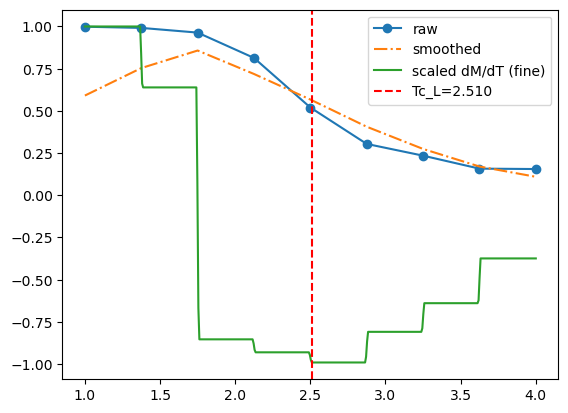

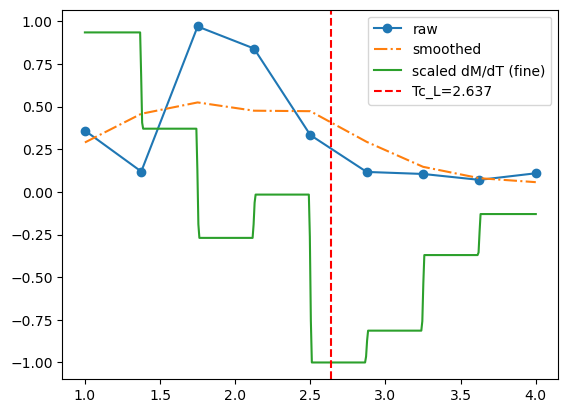

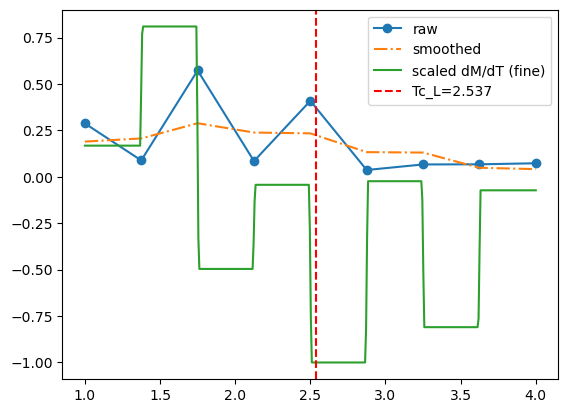

In [ ]:
Tc_L_list = []
for L, (ts, Ms, Merrs) in results.items():
    Tc_L, t_fine, dMdt_fine, Ms_smooth, dMdT = estimate_Tc_from_M_smooth(ts, Ms, smooth_window=5, interp_factor=50)
    Tc_L_list.append((L, Tc_L))
    # 可选：画出诊断图
    import matplotlib.pyplot as plt
    plt.figure()
    plt.plot(ts, Ms, 'o-', label='raw')
    plt.plot(ts, Ms_smooth, '-.', label='smoothed')
    plt.plot(t_fine, dMdt_fine / np.abs(dMdt_fine).max(), label='scaled dM/dT (fine)')
    plt.axvline(Tc_L, color='r', linestyle='--', label=f'Tc_L={Tc_L:.3f}')
    plt.legend(); plt.show()


In [ ]:
def extrapolate_Tc_infinite(Tc_L_list):
    Ls = np.array([x[0] for x in Tc_L_list])
    TcLs = np.array([x[1] for x in Tc_L_list])

    X = 1.0 / Ls
    Y = TcLs

    # linear fit: Y = Tc + aX
    coeff = np.polyfit(X, Y, 1)
    a, Tc_inf = coeff[0], coeff[1]

    return Tc_inf, a
Tc_inf, a = extrapolate_Tc_infinite(Tc_L_list)
print(f"\nEstimated Tc (L→∞ extrapolated) = {Tc_inf:.5f}")
print("Exact 2D Ising Tc = 2.26919")



Estimated Tc (L→∞ extrapolated) = 2.61590
Exact 2D Ising Tc = 2.26919


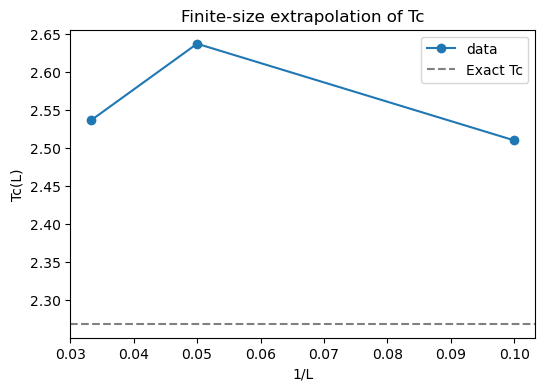

In [ ]:
plt.figure(figsize=(6,4))
Ls = np.array([x[0] for x in Tc_L_list])
TcLs = np.array([x[1] for x in Tc_L_list])
plt.plot(1/Ls, TcLs, 'o-', label='data')
plt.axhline(2.269185, color='gray', linestyle='--', label='Exact Tc')
plt.xlabel("1/L")
plt.ylabel("Tc(L)")
plt.title("Finite-size extrapolation of Tc")
plt.legend()
plt.show()
